# Paulina Jaszczuk - praca domowa 1

## Wczytanie pakietów

In [41]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import warnings
warnings.filterwarnings('ignore')
np.random.seed(23)

# Wczytanie danych

In [42]:
forest_fires_df = pd.read_csv('forest_fires_dataset.csv')
forest_fires_df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


Rozszyfrujmy niezrozumiałe skróty:
### The Fine Fuel Moisture Code (FFMC) 
represents fuel moisture of forest litter fuels under the shade of a forest canopy. It is intended to represent moisture conditions for shaded litter fuels, the equivalent of 16-hour timelag. It ranges from 0-101. Subtracting the FFMC value from 100 can provide an estimate for the equivalent (approximately 10h) fuel moisture content, most accurate when FFMC values are roughly above 80.

### The Duff Moisture Code (DMC) 
represents fuel moisture of decomposed organic material underneath the litter. System designers suggest that it is represents moisture conditions for the equivalent of 15-day (or 360 hr) timelag fuels. It is unitless and open ended. It may provide insight to live fuel moisture stress.

### The Drought Code (DC)
much like the Keetch-Byrum Drought Index, represents drying deep into the soil. It approximates moisture conditions for the equivalent of 53-day (1272 hour) timelag fuels. It is unitless, with a maximum value of 1000. Extreme drought conditions have produced DC values near 800.

### The Initial Spread Index (ISI) 
is analogous to the NFDRS Spread Component (SC). It integrates fuel moisture for fine dead fuels and surface windspeed to estimate a spread potential. ISI is a key input for fire behavior predictions in the FBP system. It is unitless and open ended.

# Wstępna eksploracja

In [3]:
forest_fires_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


In [4]:
forest_fires_df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


Nie ma braków, dane numeryczne i obiekty. describe() automatycznie nie wzięło do analizy kolumn z danymi innymi niż numeryczne, przez co się nie wysypało - fajne!

# Przegląd wizualizacji

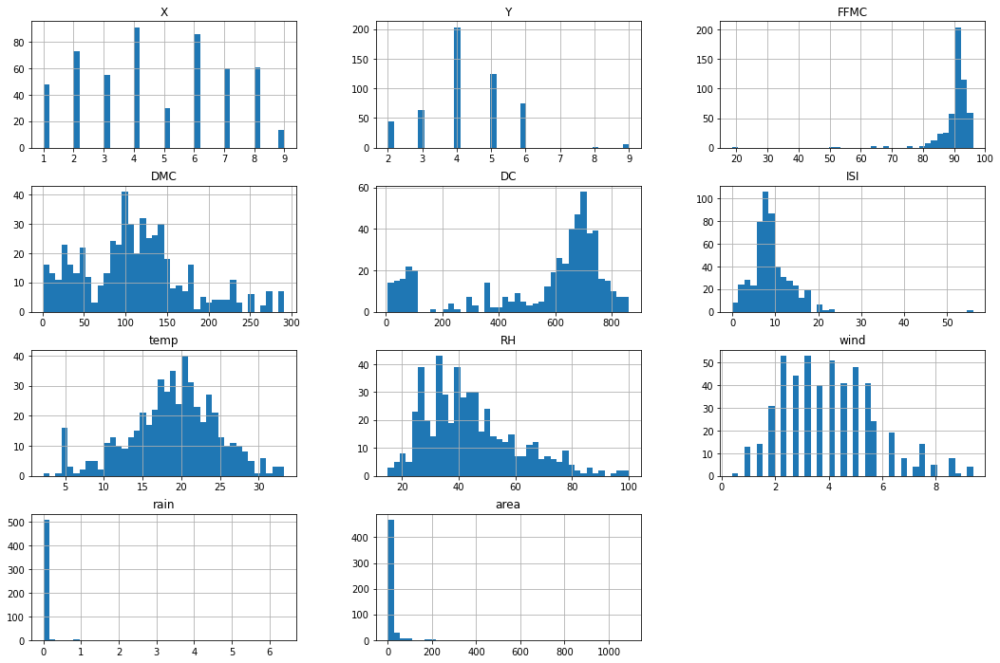

In [7]:
forest_fires_df.hist(figsize=(18, 12), bins=40)
plt.show()

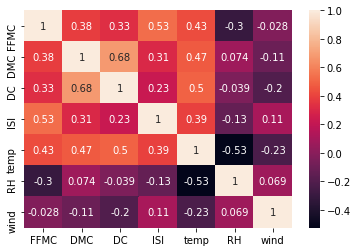

In [8]:
sns.heatmap(forest_fires_df[['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind']].corr(), annot=True)
plt.show()

Najwyższa korelacja występuje pomiędzy cechami FFMC i ISI, DMC i DC oraz RH i temperaturą

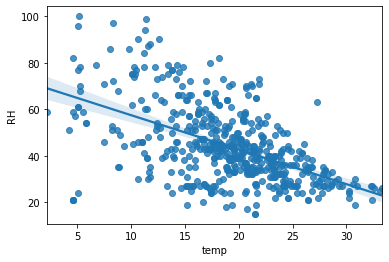

In [16]:
sns.regplot(data = forest_fires_df, x = 'temp', y = 'RH')
plt.show()

Jak widać wraz ze wzrostem temperatury maleje względna wilgotność.

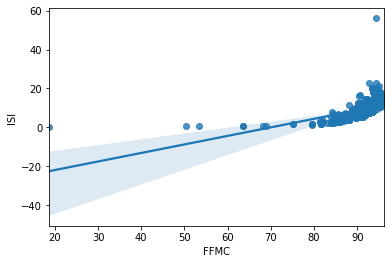

In [40]:
sns.regplot(data = forest_fires_df, x = 'FFMC', y = 'ISI')
plt.show()

Usuńmy zmienne odstające:

In [38]:
factor = 3
upper_lim1 = forest_fires_df['FFMC'].mean () + forest_fires_df['FFMC'].std () * factor
lower_lim1 = forest_fires_df['FFMC'].mean () - forest_fires_df['FFMC'].std () * factor

data = forest_fires_df[(forest_fires_df['FFMC'] < upper_lim1) & (forest_fires_df['FFMC'] > lower_lim1)]

upper_lim2 = forest_fires_df['ISI'].mean () + forest_fires_df['ISI'].std () * factor
lower_lim2 = forest_fires_df['ISI'].mean () - forest_fires_df['ISI'].std () * factor

data = data[(data['ISI'] < upper_lim2) & (data['ISI'] > lower_lim2)]

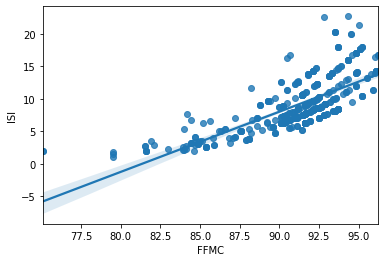

In [37]:
sns.regplot(data = data, x = 'FFMC', y = 'ISI')
plt.show()

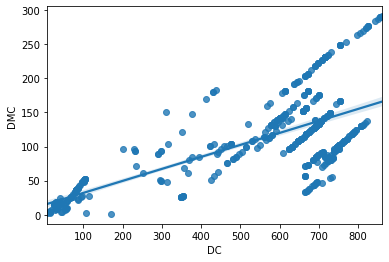

In [20]:
sns.regplot(data = forest_fires_df, x = 'DC', y = 'DMC')
plt.show()

# Korelacje ze zmienną 'area'

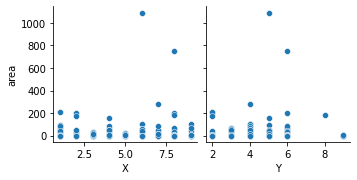

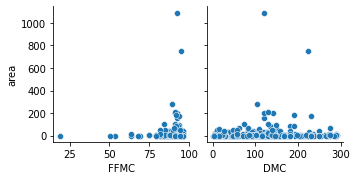

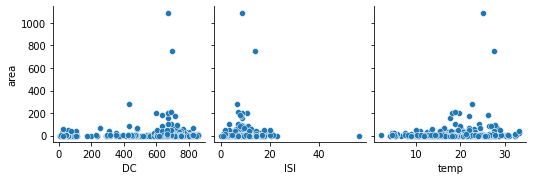

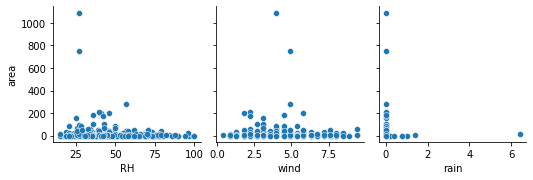

In [9]:
sns.pairplot(forest_fires_df, y_vars="area", x_vars=forest_fires_df.columns.values[:2], diag_kind=None)
sns.pairplot(forest_fires_df, y_vars="area", x_vars=forest_fires_df.columns.values[4:6], diag_kind=None)
sns.pairplot(forest_fires_df, y_vars="area", x_vars=forest_fires_df.columns.values[6:9], diag_kind=None)
sns.pairplot(forest_fires_df, y_vars="area", x_vars=forest_fires_df.columns.values[9:12], diag_kind=None)
plt.show()

Widzimy kilka zmiennych odstających.

# Analiza konkretnych obszarów

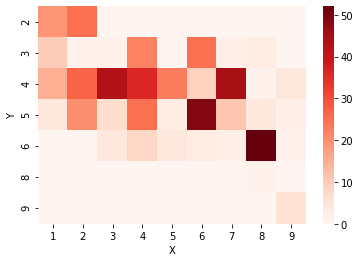

In [29]:
x = (forest_fires_df.groupby(["X", "Y"]).size().reset_index(name='number')).pivot(index="Y", columns="X", values="number").fillna(0)
sns.heatmap(x, cmap = "Reds")
plt.show()

Istnieją obszary, w których pożary występują zdecydowanie najczęściej, oraz takie, w których są one sporadyczne.

# Zależność liczby pożarów od dni tygodnia i miesięcy

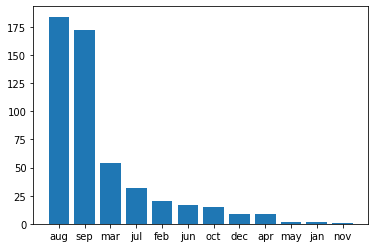

In [10]:
month_df = forest_fires_df.loc[:, 'month'].value_counts()
a = pd.DataFrame(month_df)
plt.bar(a.index, a['month'])
plt.show()

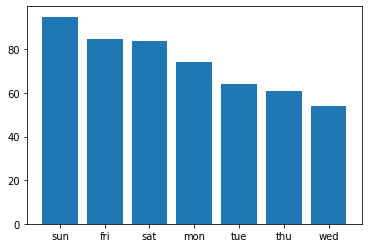

In [11]:
day_df = forest_fires_df.loc[:, 'day'].value_counts()
b = pd.DataFrame(day_df)
plt.bar(b.index, b['day'])
plt.show()

Jak widzimy, zdecydowanie najwięcej pożarów miało miejsce w sierpniu i wrześniu. Z kolei jeśli chodzi o dzień tygodnia, przodują dni weekendowe.

# Eksploracja z wykorzystaniem wbudowanych narzędzi

In [12]:
from pandas_profiling import ProfileReport

In [13]:
profile = ProfileReport(forest_fires_df, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Narzędzie umożlwia nam wstępną analizę danych. Oczywiście, nie jest ono tak dokładne i "spersonalizowane" jak własnoręczna analiza, ale może być przedatne we wstępnym etapie. Jego sporą wadą jest to, że okazuje się nieoptymalne dla dużych zbiorów danych. Poza tym nie daje nam szczegółowych informacji np. dotyczących rozkładów konkretnych cech. 